# Are transformers Recurrent models with more steps?

The general idea, is that embeddings in the KV cache is not just representing the current text token, but a combination of the current token, and the embedding latent space of the previous tokens/state (aka an RNN).
This occurs because the upper layer embeddings of each token, is built by paying attention to the historical tokens generated embeddings of the lower layer, and the current token embedding being passed through.

If so, we can prove this by doing a forward pass with a known prompt, with a critical piece of information within a specific token in the prompt.
And intentionally damage/transplant that KV cache value, and see if the subsequent token (which do not mention the critical information) is able to recover the information from the KV cache, and generate the correct answer.

If true, then yes transformers are recurrent models which store existing tokens, and next token into the KV cache, and use that to generate the next token.
If false, then the model is not able to recover the information from the KV cache, and the model is not recurrent. And depends on the attention mechanic to recall the critical information.

---

## 0) System setup

In [55]:
# Ensure the transformer lib is >= 4.44.2
#
# Due to flaws in early implementation of rope scaling, and llama3, an update is required
# https://huggingface.co/meta-llama/Meta-Llama-3.1-8B-Instruct/discussions/15
!pip3 install 'transformers>=4.44.2' accelerate SentencePiece

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.


## 1) Model setup, and doing example forward with the prompts

In [56]:
# Import the hugging face transformers library, and load the llama 8B model
import transformers
import torch
import copy
import matplotlib.pyplot as plt
from transformers import LlamaForCausalLM, AutoTokenizer

# We are using the nous model mirror, instead of meta official, so that it works without the HF API key
model_id = "NousResearch/Meta-Llama-3.1-8B-Instruct"
# model_id = "meta-llama/Meta-Llama-3.1-8B-Instruct"

# Load the model and tokenizer
model = LlamaForCausalLM.from_pretrained(model_id)
tokenizer = AutoTokenizer.from_pretrained(model_id)

# Set the model to evaluation mode
model.eval()


Loading checkpoint shards: 100%|██████████| 4/4 [00:19<00:00,  4.91s/it]


LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(128256, 4096)
    (layers): ModuleList(
      (0-31): 32 x LlamaDecoderLayer(
        (self_attn): LlamaSdpaAttention(
          (q_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (k_proj): Linear(in_features=4096, out_features=1024, bias=False)
          (v_proj): Linear(in_features=4096, out_features=1024, bias=False)
          (o_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (rotary_emb): LlamaRotaryEmbedding()
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear(in_features=4096, out_features=14336, bias=False)
          (up_proj): Linear(in_features=4096, out_features=14336, bias=False)
          (down_proj): Linear(in_features=14336, out_features=4096, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
        (post_attention_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
      )
    )
    (n

In [57]:
# The various strings, we want to use to analyse the KV cache values
# 
# Note, options should be 1 token in length, use the following to check
# https://belladoreai.github.io/llama3-tokenizer-js/example-demo/build/
PREFIX = "User: I am flying to"
OPTION_LIST = [" SF", " NY"]
SUFFIX_CHUNK = " city and I would want you to think about a list of places I should be traveling and visiting, as a history nerd. Let me know when your ready (do not answer now, do not ask additional questions). I will ask you again later for the full answer. \n\n"
SUFFIX_CHUNK += "Assistant: Hmm... Ok, (pause), I'm ready to answer now.\n\nUser: Great, now tell me the full answer.\n\n"

SUFFIX_FORWARD = "Assistant: "

# Tokenize the strings
prefix_tokens = tokenizer.encode(PREFIX, return_tensors="pt")
option_tokens = [ tokenizer.encode(option, return_tensors="pt",  add_special_tokens=False) for option in OPTION_LIST ]
suffix_chunk_tokens = tokenizer.encode(SUFFIX_CHUNK, return_tensors="pt",  add_special_tokens=False)
suffix_forward_tokens = tokenizer.encode(SUFFIX_FORWARD, return_tensors="pt",  add_special_tokens=False)

print( "Option Tokens:", option_tokens )

# Get the token count for the prefix and suffix
print(f"Prefix token count: {prefix_tokens.shape[1]}")
print(f"Suffix token count: {suffix_chunk_tokens.shape[1]}")

Option Tokens: [tensor([[24360]]), tensor([[12551]])]
Prefix token count: 7
Suffix token count: 82


In [58]:
# Lets try to forward and show the model answer for the given prompt, with the first 200 tokens of the output, for both options
# To give a general idea of what is the expected output

# Tokenize the input
input = PREFIX + OPTION_LIST[0] + SUFFIX_CHUNK + SUFFIX_FORWARD
input_ids = tokenizer(input, return_tensors="pt").input_ids
# Forward the model
output = model.generate(input_ids, max_length=200)
# Decode the output
output_text = tokenizer.decode(output[0], skip_special_tokens=True)
# Print the output
print("===================================")
print(f"Option 1: {OPTION_LIST[0]}")
print("===================================")
print(output_text)

# Tokenize the input
input = PREFIX + OPTION_LIST[1] + SUFFIX_CHUNK + SUFFIX_FORWARD
input_ids = tokenizer(input, return_tensors="pt").input_ids
# Forward the model
output = model.generate(input_ids, max_length=200)
# Decode the output
output_text = tokenizer.decode(output[0], skip_special_tokens=True)
# Print the output
print("===================================")
print(f"Option 2: {OPTION_LIST[1]}")
print("===================================")
print(output_text)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Option 1:  SF
User: I am flying to SF city and I would want you to think about a list of places I should be traveling and visiting, as a history nerd. Let me know when your ready (do not answer now, do not ask additional questions). I will ask you again later for the full answer. 

Assistant: Hmm... Ok, (pause), I'm ready to answer now.

User: Great, now tell me the full answer.

Assistant:  As a history nerd visiting San Francisco, here's a list of places you shouldn't miss:

**Historic Landmarks:**

1. **Alcatraz Island**: The infamous former prison turned national park, now a symbol of American history and a must-visit attraction.
2. **Golden Gate Bridge**: An engineering marvel and an iconic symbol of San Francisco, completed in 1937.
3. **Presidio**: A former military base turned national park, featuring historic buildings, scenic views, and a rich history dating back
Option 2:  NY
User: I am flying to NY city and I would want you to think about a list of places I should be travel

## 2) Lets generate the KV cache for both option/prompts

We also generate the respective answer with greddy sampling.

In [59]:
# Get the prefix KV cache
with torch.no_grad():
    prefix_model_output = model(prefix_tokens, use_cache=True)

prefix_kv_cache = prefix_model_output.past_key_values

In [60]:
# Lets figure out the prefix_kv_cache structure
print("L0", type(prefix_kv_cache), len(prefix_kv_cache)) # Split by layer? or is it attention head?
print("L1", type(prefix_kv_cache[31]), len(prefix_kv_cache[31])) # Split by K/V
print("L2.k", type(prefix_kv_cache[31][0]), prefix_kv_cache[31][0].shape) # 1, <kv_heads=8>, <tokens>, <head_embed_size=128>
print("L2.v", type(prefix_kv_cache[31][1]), prefix_kv_cache[31][1].shape) # 1, <kv_heads=8>, <tokens>, <head_embed_size=128>

L0 <class 'tuple'> 32
L1 <class 'tuple'> 2
L2.k <class 'torch.Tensor'> torch.Size([1, 8, 7, 128])
L2.v <class 'torch.Tensor'> torch.Size([1, 8, 7, 128])


In [61]:
# Forward/get with kv cache functions
def forward_and_get_output(input_ids, past_key_values=None):
    with torch.no_grad():
        outputs = model(input_ids, use_cache=True, past_key_values=past_key_values)
    return outputs

def forward_and_get_cache(input_ids, past_key_values=None):
    return forward_and_get_output(input_ids, past_key_values).past_key_values

def generate_with_cache(input_ids, past_key_values, max_new_tokens=100, print_tokens=False):
    # Initial forward pass
    outputs = forward_and_get_output(input_ids, past_key_values)

    # Output tokens
    generated_tokens = []

    # Generate 1 token at a time
    for i in range(max_new_tokens):
        # Greedy Sample the top 1 token (lazy)
        next_token = torch.argmax(outputs.logits[:, -1, :])
        # Append the token to the generated tokens
        generated_tokens.append(next_token)

        # Print the token if required
        if print_tokens:
            print(tokenizer.decode(next_token.unsqueeze(0), skip_special_tokens=True), end="")

        # Forward the model
        outputs = forward_and_get_output(next_token.unsqueeze(0).unsqueeze(0), outputs.past_key_values)
        # Append the new outputs to the past_key_values
        past_key_values = outputs.past_key_values

    # Generated tokens to tensor
    generated_tokens = torch.stack(generated_tokens, dim=0)

    # Convert the generated tokens to a tensor -> text
    return tokenizer.decode(generated_tokens, skip_special_tokens=True)

# Deep equal check for the kv_cache
def kv_cache_equals(a,b):
    for layer_idx in range(len(a)):
        for kv_idx in range(2):
            if not torch.all(a[layer_idx][kv_idx] == b[layer_idx][kv_idx]):
                return False
    return True

In [62]:
# Lets forward the model with the prefix_kv_cache, and each option
option_1_kv_cache = forward_and_get_cache(option_tokens[0], prefix_kv_cache)
option_2_kv_cache = forward_and_get_cache(option_tokens[1], prefix_kv_cache)

# Lets forward with the suffix_chunk, and the kv cache for each option
option_1_kv_cache = forward_and_get_cache(suffix_chunk_tokens, option_1_kv_cache)
option_2_kv_cache = forward_and_get_cache(suffix_chunk_tokens, option_2_kv_cache)

# print("L0", type(option_1_kv_cache), len(option_1_kv_cache)) # Split by layer? or is it attention head?
# print("L1", type(option_1_kv_cache[31]), len(option_1_kv_cache[31])) # Split by K/V
# print("L2.k", type(option_1_kv_cache[31][0]), option_1_kv_cache[31][0].shape) # 1, <kv_heads=8>, <tokens>, <head_embed_size=128>
# print("L2.v", type(option_1_kv_cache[31][1]), option_1_kv_cache[31][1].shape) # 1, <kv_heads=8>, <tokens>, <head_embed_size=128>

print("Generated states for both options")


Generated states for both options


In [63]:
# Lets generate the output for each option
print("===================================")
print(f"Option 1: {OPTION_LIST[0]}")
print("===================================")
print(SUFFIX_FORWARD, end="")
generate_with_cache(suffix_forward_tokens, option_1_kv_cache, print_tokens=True)
print("")

print("===================================")
print(f"Option 2: {OPTION_LIST[1]}")
print("===================================")
print(SUFFIX_FORWARD, end="")
generate_with_cache(suffix_forward_tokens, option_2_kv_cache, print_tokens=True)
print("")

Option 1:  SF
Assistant:  As a history nerd, you'll love exploring the rich and diverse history of San Francisco. Here's a list of must-visit places to add to your itinerary:

1. **Alcatraz Island**: This former maximum-security prison turned national park is a must-visit for any history buff. Take a guided tour to learn about the infamous inmates and guards who once called Alcatraz home.
2. **Golden Gate Bridge**: While not strictly a historical site, the Golden Gate Bridge is an iconic
Option 2:  NY
Assistant:  As a history nerd, you'll want to explore the rich and diverse history of New York City. Here's a list of must-visit places:

**Historic Landmarks:**

1. **Statue of Liberty and Ellis Island**: Take a ferry to Liberty Island to see the iconic statue up close and visit the Ellis Island Immigration Museum to learn about the history of immigration in the United States.
2. **9/11 Memorial & Museum**: A poignant tribute to the victims of the 9


## 3) Lets generate again, with damaged KV cache / Transplanted KV cache

### **Damaged/Zeroed token KV**

Shows that the model is able to recover the information from the other tokens KV cache, and generate the correct answer.

In [64]:
# Frankenstein the kv_cache
frankenstein_kv_cache = copy.deepcopy(option_2_kv_cache)

assert kv_cache_equals(frankenstein_kv_cache, option_2_kv_cache)

for layer_idx in range(len(frankenstein_kv_cache)):
    for kv_idx in range(2):
        # So lets go more extream, and just zero out the prefix tokens in the frankenstein KV - so that we depend on the suffix embedding to generate the output
        frankenstein_kv_cache[layer_idx][kv_idx][:, :, prefix_tokens.shape[1]:prefix_tokens.shape[1]+1] = 0

assert kv_cache_equals(frankenstein_kv_cache, option_2_kv_cache) == False
assert kv_cache_equals(frankenstein_kv_cache, option_1_kv_cache) == False

# Lets generate the output for the frankenstein
print("===================================")
print(f"Frankenstein Option (prefix option zeroed out, suffix from option 2 - {OPTION_LIST[1]})")
print("===================================")
print(SUFFIX_FORWARD, end="")
generate_with_cache(suffix_forward_tokens, frankenstein_kv_cache, print_tokens=True)
print("")


Frankenstein Option (prefix option zeroed out, suffix from option 2 - New York)
Assistant:  As a history nerd, you'll want to explore the rich and diverse history of New York City. Here's a list of must-visit places:

**Historic Landmarks:**

1. **Statue of Liberty and Ellis Island**: Take a ferry to Liberty Island to see the iconic statue up close and visit the Ellis Island Immigration Museum to learn about the history of immigration in the United States.
2. **9/11 Memorial & Museum**: A poignant tribute to the victims of the 9


In [65]:
# Frankenstein the kv_cache
frankenstein_kv_cache = copy.deepcopy(option_1_kv_cache)

assert kv_cache_equals(frankenstein_kv_cache, option_1_kv_cache)

for layer_idx in range(len(frankenstein_kv_cache)):
    for kv_idx in range(2):
        # So lets go more extream, and just zero out the prefix tokens in the frankenstein KV - so that we depend on the suffix embedding to generate the output
        frankenstein_kv_cache[layer_idx][kv_idx][:, :, prefix_tokens.shape[1]:prefix_tokens.shape[1]+1] = 0

assert kv_cache_equals(frankenstein_kv_cache, option_2_kv_cache) == False
assert kv_cache_equals(frankenstein_kv_cache, option_1_kv_cache) == False

# Lets generate the output for the frankenstein
print("===================================")
print(f"Frankenstein Option (prefix option zeroed out, suffix from option 1 - {OPTION_LIST[0]}")
print("===================================")
print(SUFFIX_FORWARD, end="")
generate_with_cache(suffix_forward_tokens, frankenstein_kv_cache, print_tokens=True)
print("")


Frankenstein Option (prefix option zeroed out, suffix from option 1 - San Francisco)
Assistant:  As a history nerd, you'll want to explore the rich and diverse history of San Francisco. Here's a list of must-visit places:

1. **Alcatraz Island**: This former maximum-security prison turned national park is a must-visit for any history buff. Take a guided tour to learn about the infamous inmates and guards who once called Alcatraz home.
2. **Golden Gate Bridge**: While not strictly a historical site, the Golden Gate Bridge is an iconic symbol of San Francisco


### **Transplanted token KV**

Shows that the transplanted token, is able to overpower the latent embedding space of the other tokens, and generate the "transplanted" answer.

In [76]:
# Frankenstein the kv_cache
frankenstein_kv_cache = copy.deepcopy(option_2_kv_cache)

assert kv_cache_equals(frankenstein_kv_cache, option_2_kv_cache)

for layer_idx in range(len(frankenstein_kv_cache)):
    for kv_idx in range(2):
        # Transplant the prefix tokens from option 1 to option 2 - in this case, the transplanted value is actually strong enough, that it out weigh the recurrent thoughts within the suffix embedding
        # We can either weaken the values (*0.5, or just zero it out instead)
        frankenstein_kv_cache[layer_idx][kv_idx][:, :, prefix_tokens.shape[1]:prefix_tokens.shape[1]+1] = option_1_kv_cache[layer_idx][kv_idx][:, :, prefix_tokens.shape[1]:prefix_tokens.shape[1]+1] # * 0.5

        # So lets go more extream, and just zero out the prefix tokens in the frankenstein KV - so that we depend on the suffix embedding to generate the output
        # frankenstein_kv_cache[layer_idx][kv_idx][:, :, prefix_tokens.shape[1]:prefix_tokens.shape[1]+1] = 0

assert kv_cache_equals(frankenstein_kv_cache, option_2_kv_cache) == False
assert kv_cache_equals(frankenstein_kv_cache, option_1_kv_cache) == False

# Lets generate the output for the frankenstein
print("===================================")
print(f"Frankenstein Option (prefix from option 1 {OPTION_LIST[0]}, suffix from option 2 {OPTION_LIST[1]})")
print("===================================")
print(SUFFIX_FORWARD, end="")
generate_with_cache(suffix_forward_tokens, frankenstein_kv_cache, print_tokens=True)
print("")

Frankenstein Option (prefix from option 1, suffix from option 2)
Assistant:  As a history nerd visiting New York City, here's a list of must-visit places:

1. **The Statue of Liberty and Ellis Island**: Take a ferry to Liberty Island to see the iconic statue up close and visit the Ellis Island Immigration Museum to learn about the history of immigration in the United States.
2. **The 9/11 Memorial & Museum**: A poignant tribute to the victims of the 9/11 attacks, featuring two massive reflecting pools and a museum with artifacts and stories


In [77]:
# Frankenstein the kv_cache
frankenstein_kv_cache = copy.deepcopy(option_1_kv_cache)

assert kv_cache_equals(frankenstein_kv_cache, option_1_kv_cache)

for layer_idx in range(len(frankenstein_kv_cache)):
    for kv_idx in range(2):
        # Transplant the prefix tokens from option 1 to option 2 - in this case, the transplanted value is actually strong enough, that it out weigh the recurrent thoughts within the suffix embedding
        # We can either weaken the values (*0.5, or just zero it out instead)
        frankenstein_kv_cache[layer_idx][kv_idx][:, :, prefix_tokens.shape[1]:prefix_tokens.shape[1]+1] = option_2_kv_cache[layer_idx][kv_idx][:, :, prefix_tokens.shape[1]:prefix_tokens.shape[1]+1] # * 0.5

assert kv_cache_equals(frankenstein_kv_cache, option_2_kv_cache) == False
assert kv_cache_equals(frankenstein_kv_cache, option_1_kv_cache) == False

# Lets generate the output for the frankenstein
print("===================================")
print(f"Frankenstein Option (prefix from option 2 {OPTION_LIST[1]}, suffix from option 1 {OPTION_LIST[0]})")
print("===================================")
print(SUFFIX_FORWARD, end="")
generate_with_cache(suffix_forward_tokens, frankenstein_kv_cache, print_tokens=True)
print("")

Frankenstein Option (prefix from option 2, suffix from option 1)
Assistant:  As a history nerd, you'll want to explore the rich and diverse history of New York City. Here's a list of must-visit places:

1.  **The Statue of Liberty and Ellis Island**: Take a ferry to Liberty Island to see the iconic Statue of Liberty up close and visit the Ellis Island Immigration Museum to learn about the history of immigration in the United States.
2.  **The 9/11 Memorial & Museum**: A poignant tribute to the victims of the 9/


## Lets try to visualize

In [68]:
def kv_slice(kv_cache, start, end):
    return [ [ kv[0][:, :, start:end], kv[1][:, :, start:end] ] for kv in kv_cache ]

# Merges the layer values, and averages them
def kv_token_merge(kv_cache):
    return [ [ kv[0].mean(dim=2), kv[1].mean(dim=2) ] for kv in kv_cache ]

# Merge the layer values, and average them
def kv_layer_merge(kv_cache):
    # Get the layer count
    layer_count = len(kv_cache)

    # K and V stack
    k_stack = torch.stack([ kv[0] for kv in kv_cache ], dim=0)
    v_stack = torch.stack([ kv[1] for kv in kv_cache ], dim=0)

    # Average the stack (1,8,128)
    k_avg = k_stack.mean(dim=0)
    v_avg = v_stack.mean(dim=0)

    # Reduce the average dimensions to (8,128)
    k_avg = k_avg.squeeze(0)
    v_avg = v_avg.squeeze(0)

    return [ k_avg, v_avg ]

def kv_layer_token_merge(kv_cache):
    return kv_layer_merge(kv_token_merge(kv_cache))


Min K Val: -1.2061197757720947
Max K Val: 1.0231575965881348
Min V Val: -0.17546311020851135
Max V Val: 0.22913894057273865


Text(0.5, 1.0, 'Option 2 - Critical Token - V State Embeddings :  NY')

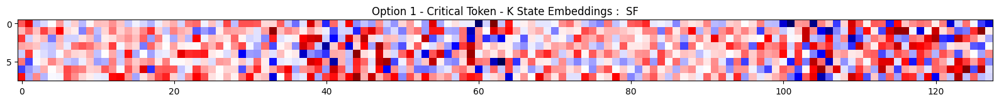

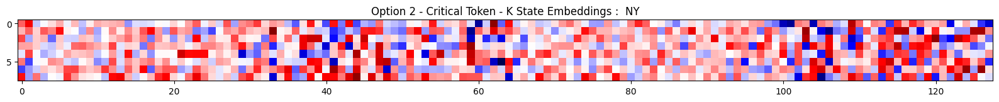

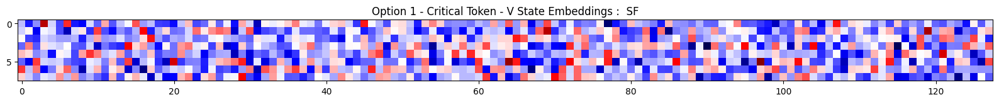

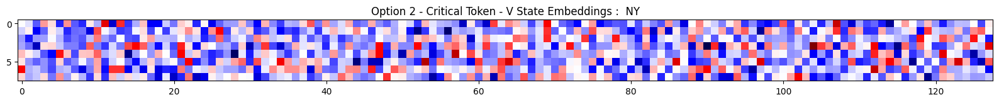

In [69]:
# Lets merge the token value, and visualize the merged token embeddings
option_token_1_kv_emb = kv_layer_token_merge( kv_slice(option_1_kv_cache, prefix_tokens.shape[1], prefix_tokens.shape[1]+1) )
option_token_2_kv_emb = kv_layer_token_merge( kv_slice(option_2_kv_cache, prefix_tokens.shape[1], prefix_tokens.shape[1]+1) )

# Get the min value for the color map
min_k_val = min( option_token_1_kv_emb[0].min().item(), option_token_2_kv_emb[0].min().item() )
max_k_val = max( option_token_1_kv_emb[0].max().item(), option_token_2_kv_emb[0].max().item() )
min_v_val = min( option_token_1_kv_emb[1].min().item(), option_token_2_kv_emb[1].min().item() )
max_v_val = max( option_token_1_kv_emb[1].max().item(), option_token_2_kv_emb[1].max().item() )

print("Min K Val:", min_k_val)
print("Max K Val:", max_k_val)
print("Min V Val:", min_v_val)
print("Max V Val:", max_v_val)

# Visualize the token embeddings

plt.figure(figsize=(20, 20))
plt.imshow(option_token_1_kv_emb[0].cpu().numpy(), cmap='seismic', vmin=min_k_val, vmax=max_k_val)
plt.title(f"Option 1 - Critical Token - K State Embeddings : {OPTION_LIST[0]}")

plt.figure(figsize=(20, 20))
plt.imshow(option_token_2_kv_emb[0].cpu().numpy(), cmap='seismic', vmin=min_k_val, vmax=max_k_val)
plt.title(f"Option 2 - Critical Token - K State Embeddings : {OPTION_LIST[1]}")

plt.figure(figsize=(20, 20))
plt.imshow(option_token_1_kv_emb[1].cpu().numpy(), cmap='seismic', vmin=min_v_val, vmax=max_v_val)
plt.title(f"Option 1 - Critical Token - V State Embeddings : {OPTION_LIST[0]}")

plt.figure(figsize=(20, 20))
plt.imshow(option_token_2_kv_emb[1].cpu().numpy(), cmap='seismic', vmin=min_v_val, vmax=max_v_val)
plt.title(f"Option 2 - Critical Token - V State Embeddings : {OPTION_LIST[1]}")

# # Red is positive, blue is negative, white is zero
# plt.colorbar()
# plt.tight_layout()
# plt.show()

Min K Val (1 | 2 | both): -1.2228378057479858 | -1.2224829196929932 | -1.2228378057479858
Max K Val (1 | 2 | both): 1.062016248703003 | 1.0689918994903564 | 1.0689918994903564
Min V Val (1 | 2 | both): -0.1158093810081482 | -0.11690708249807358 | -0.11690708249807358
Max V Val (1 | 2 | both): 0.15423786640167236 | 0.15455657243728638 | 0.15455657243728638


Text(0.5, 1.0, 'Option 2 - Suffix State - V State Embeddings :  NY')

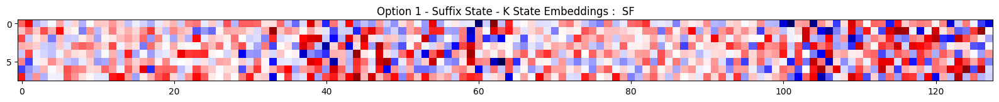

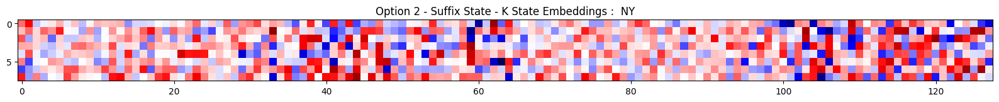

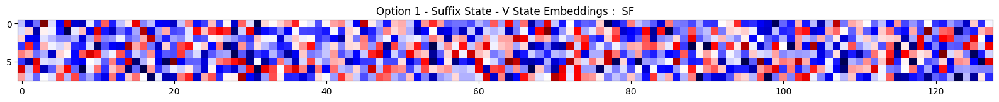

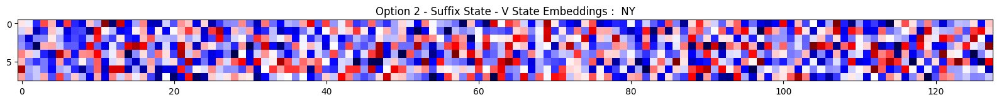

In [70]:
# Lets get the suffix embeddings for both options, and visualize them
option_suffix_1_kv_emb = kv_layer_token_merge( kv_slice(option_1_kv_cache, prefix_tokens.shape[1]+1, -1) )
option_suffix_2_kv_emb = kv_layer_token_merge( kv_slice(option_2_kv_cache, prefix_tokens.shape[1]+1, -1) )

# Get the min value for the color map
opt1_min_k_val = option_suffix_1_kv_emb[0].min().item()
opt1_max_k_val = option_suffix_1_kv_emb[0].max().item()
opt1_min_v_val = option_suffix_1_kv_emb[1].min().item()
opt1_max_v_val = option_suffix_1_kv_emb[1].max().item()

opt2_min_k_val = option_suffix_2_kv_emb[0].min().item()
opt2_max_k_val = option_suffix_2_kv_emb[0].max().item()
opt2_min_v_val = option_suffix_2_kv_emb[1].min().item()
opt2_max_v_val = option_suffix_2_kv_emb[1].max().item()

min_k_val = min( option_suffix_1_kv_emb[0].min().item(), option_suffix_2_kv_emb[0].min().item() )
max_k_val = max( option_suffix_1_kv_emb[0].max().item(), option_suffix_2_kv_emb[0].max().item() )
min_v_val = min( option_suffix_1_kv_emb[1].min().item(), option_suffix_2_kv_emb[1].min().item() )
max_v_val = max( option_suffix_1_kv_emb[1].max().item(), option_suffix_2_kv_emb[1].max().item() )

print("Min K Val (1 | 2 | both):", opt1_min_k_val, "|", opt2_min_k_val, "|", min_k_val)
print("Max K Val (1 | 2 | both):", opt1_max_k_val, "|", opt2_max_k_val, "|", max_k_val)
print("Min V Val (1 | 2 | both):", opt1_min_v_val, "|", opt2_min_v_val, "|", min_v_val)
print("Max V Val (1 | 2 | both):", opt1_max_v_val, "|", opt2_max_v_val, "|", max_v_val)

plt.figure(figsize=(20, 20))
plt.imshow(option_token_1_kv_emb[0].cpu().numpy(), cmap='seismic', vmin=min_k_val, vmax=max_k_val)
plt.title(f"Option 1 - Suffix State - K State Embeddings : {OPTION_LIST[0]}")

plt.figure(figsize=(20, 20))
plt.imshow(option_token_2_kv_emb[0].cpu().numpy(), cmap='seismic', vmin=min_k_val, vmax=max_k_val)
plt.title(f"Option 2 - Suffix State - K State Embeddings : {OPTION_LIST[1]}")

plt.figure(figsize=(20, 20))
plt.imshow(option_token_1_kv_emb[1].cpu().numpy(), cmap='seismic', vmin=min_v_val, vmax=max_v_val)
plt.title(f"Option 1 - Suffix State - V State Embeddings : {OPTION_LIST[0]}")

plt.figure(figsize=(20, 20))
plt.imshow(option_token_2_kv_emb[1].cpu().numpy(), cmap='seismic', vmin=min_v_val, vmax=max_v_val)
plt.title(f"Option 2 - Suffix State - V State Embeddings : {OPTION_LIST[1]}")

Min K Val: -0.019761472940444946
Max K Val: 0.020912915468215942
Min V Val: -0.006983703002333641
Max V Val: 0.009718678891658783


Text(0.5, 1.0, 'Delta - V State Embeddings')

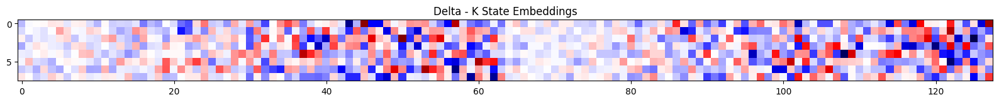

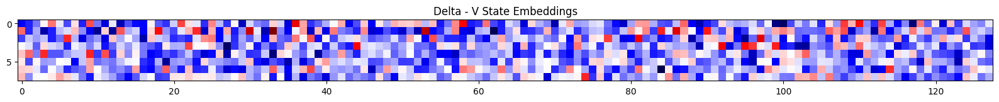

In [71]:
# Lets get the delta between the two options K / V, and visualize them
delta_kv = [ option_suffix_1_kv_emb[0] - option_suffix_2_kv_emb[0], option_suffix_1_kv_emb[1] - option_suffix_2_kv_emb[1] ]

# Get the min value for the color map
min_k_val = delta_kv[0].min().item()
max_k_val = delta_kv[0].max().item()
min_v_val = delta_kv[1].min().item()
max_v_val = delta_kv[1].max().item()

print("Min K Val:", min_k_val)
print("Max K Val:", max_k_val)
print("Min V Val:", min_v_val)
print("Max V Val:", max_v_val)

plt.figure(figsize=(20, 20))
plt.imshow(delta_kv[0].cpu().numpy(), cmap='seismic', vmin=min_k_val, vmax=max_k_val)
plt.title(f"Delta - K State Embeddings")

plt.figure(figsize=(20, 20))
plt.imshow(delta_kv[1].cpu().numpy(), cmap='seismic', vmin=min_v_val, vmax=max_v_val)
plt.title(f"Delta - V State Embeddings")

# Visualize the delta overtime

In [72]:
# print("L0", type(option_1_kv_cache), len(option_1_kv_cache)) # Split by layer? or is it attention head?
# print("L1", type(option_1_kv_cache[31]), len(option_1_kv_cache[31])) # Split by K/V
# print("L2.k", type(option_1_kv_cache[31][0]), option_1_kv_cache[31][0].shape) # 1, <kv_heads=8>, <tokens>, <head_embed_size=128>
# print("L2.v", type(option_1_kv_cache[31][1]), option_1_kv_cache[31][1].shape) # 1, <kv_heads=8>, <tokens>, <head_embed_size=128>

delta_kv_state = copy.deepcopy(option_1_kv_cache)
for layer_idx in range(len(delta_kv_state)):
    for kv_idx in range(2):
        delta_kv_state[layer_idx][kv_idx][:] -= option_2_kv_cache[layer_idx][kv_idx][:]

# Lets reshape 1, kv_head, tokens, head_embed_size -> tokens, kv_head * head_embed_size
delta_kv_time_state = [ [ kv[0].squeeze(0).permute(1,0,2).reshape(-1, 8*128), kv[1].squeeze(0).permute(1,0,2).reshape(-1, 8*128) ] for kv in delta_kv_state ]

# Get the min value for the color map
min_k_val = min( delta_kv_time_state[0][0].min().item(), delta_kv_time_state[1][0].min().item() )
max_k_val = max( delta_kv_time_state[0][0].max().item(), delta_kv_time_state[1][0].max().item() )
max_abs_k_val = max( abs(min_k_val), abs(max_k_val) )
min_v_val = min( delta_kv_time_state[0][1].min().item(), delta_kv_time_state[1][1].min().item() )
max_v_val = max( delta_kv_time_state[0][1].max().item(), delta_kv_time_state[1][1].max().item() )
max_abs_v_val = max( abs(min_v_val), abs(max_v_val) )

print("Min/Max/Abs K Val:", min_k_val, ",", max_k_val, ",", max_abs_k_val)
print("Min/Max/Abs V Val:", min_v_val, ",", max_v_val, ",", max_abs_v_val)

Min/Max/Abs K Val: -4.533350944519043 , 4.162558078765869 , 4.533350944519043
Min/Max/Abs V Val: -0.8703749179840088 , 0.4232632517814636 , 0.8703749179840088


In [73]:
# Lets try to get the token position to word mapping
OPTION_1_TEXT = PREFIX + OPTION_LIST[0] + SUFFIX_CHUNK + SUFFIX_FORWARD
OPTION_1_TOKENS = tokenizer.encode(OPTION_1_TEXT, return_tensors="pt")

# Lets split it by groups of 10 to make it easier to read
token_groups = [ OPTION_1_TOKENS[0][i:i+10] for i in range(0, OPTION_1_TOKENS.shape[1], 10) ]

# Lets decode the tokens
token_groups_text = [ tokenizer.decode(group, skip_special_tokens=True) for group in token_groups ]

# Lets print the token groups
token_n=0
for group in token_groups_text:
    group_esc = group.replace("\n", "\\n")
    # Left pad the token number

    print(f"Token Group {token_n:03} |{group_esc}")
    token_n += 10

Token Group 000 |User: I am flying to SF city and
Token Group 010 | I would want you to think about a list of
Token Group 020 | places I should be traveling and visiting, as a
Token Group 030 | history nerd. Let me know when your ready (
Token Group 040 |do not answer now, do not ask additional questions
Token Group 050 |). I will ask you again later for the full
Token Group 060 | answer. \n\nAssistant: Hmm... Ok, (
Token Group 070 |pause), I'm ready to answer now.\n\nUser
Token Group 080 |: Great, now tell me the full answer.\n\n
Token Group 090 |Assistant: 


/var/folders/71/91hw6kks41v97jkjp028xxbr0000gp/T/ipykernel_95508/2759664663.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 15))


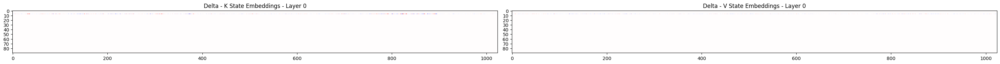

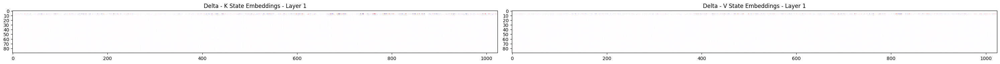

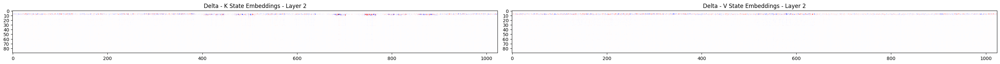

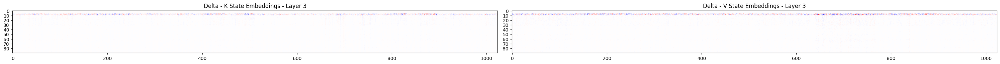

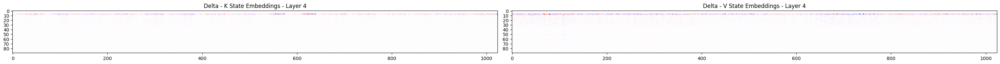

...

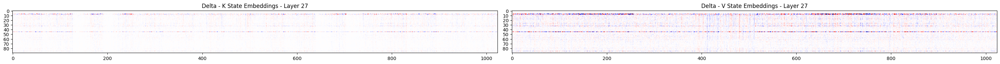

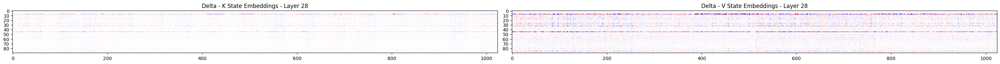

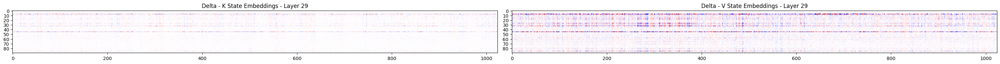

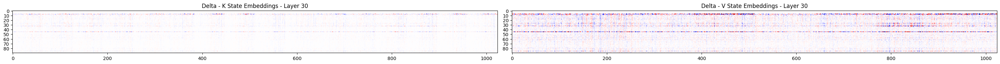

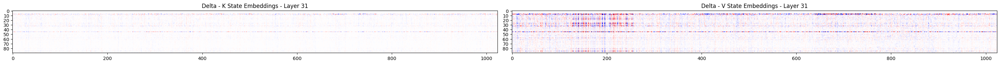

In [74]:
# For each layer, lets visualize the delta K, V values side by side
# Y-axis: is token time (~160)
# X-axis: is kv_head * head_embed_size (~1024)
for layer_idx in range(len(delta_kv_time_state)):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 15))
    
    ax1.imshow(delta_kv_time_state[layer_idx][0].cpu().numpy(), cmap='seismic', vmin=-max_abs_k_val, vmax=max_abs_k_val)
    ax1.set_yticks(range(0, delta_kv_time_state[layer_idx][0].shape[0], 10))
    ax1.set_title(f"Delta - K State Embeddings - Layer {layer_idx}")

    ax2.imshow(delta_kv_time_state[layer_idx][1].cpu().numpy(), cmap='seismic', vmin=-max_abs_v_val, vmax=max_abs_v_val)
    ax2.set_yticks(range(0, delta_kv_time_state[layer_idx][1].shape[0], 10))
    ax2.set_title(f"Delta - V State Embeddings - Layer {layer_idx}")

    fig.tight_layout()

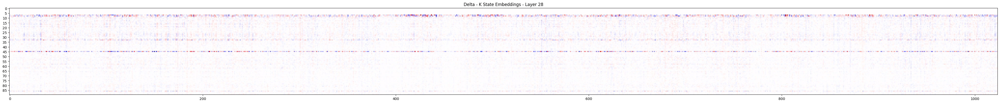

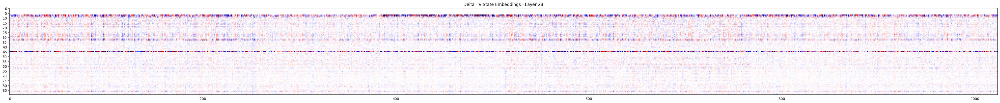

In [75]:
# Layer 28, focused

# Y-axis: is token time (~160)
# X-axis: is kv_head * head_embed_size (~1024)
layer_idx = 28

plt.figure(figsize=(40, 40))
plt.imshow(delta_kv_time_state[layer_idx][0].cpu().numpy(), cmap='seismic', vmin=-max_abs_k_val, vmax=max_abs_k_val)
plt.yticks(range(0, delta_kv_time_state[layer_idx][1].shape[0], 5))
plt.title(f"Delta - K State Embeddings - Layer {layer_idx}")
plt.tight_layout()

plt.figure(figsize=(40, 40))
plt.imshow(delta_kv_time_state[layer_idx][1].cpu().numpy(), cmap='seismic', vmin=-max_abs_v_val, vmax=max_abs_v_val)
plt.yticks(range(0, delta_kv_time_state[layer_idx][1].shape[0], 5))
plt.title(f"Delta - V State Embeddings - Layer {layer_idx}")
plt.tight_layout()